# Imports

In [1]:
#from google.colab import drive
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

In [ ]:
drive.mount('/content/drive')

! cp "/content/drive/Shareddrives/Computer Vision/Data/CV_subset.zip" "CV_subset.zip"
! cp "/content/drive/Shareddrives/Computer Vision/Data/CV_dataset.csv" "CV_dataset.csv"

! unzip -q "CV_subset.zip"

! rm "CV_subset.zip"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data exploration

In [2]:
df = pd.read_csv("CV_dataset.csv")
df.head(2)

,filename,watermark,humans,food_inside,multiple_containers,text,background,drawing,name,Agréé contact alimentaire,...,Utilisation four traditionnel,Utilisation micro-ondes,Groupe Produit,Code Groupe Produit,Code Enseigne,Epaisseur en microns,Personnalisable,Diamètre,Colisage en kg,Nombre de feuilles par paquet de 10kg
0,barquette-plastique-blanche-avec-couvercle-450...,0,1,0,0,0,0,0,Barquette Carty micro-ondable 450 ml | Mon-emb...,Oui,...,Non,Oui,BOITE CARTY OPAQUE AVEC COUVERCLE,7.0,909421320.0,NaN,NaN,NaN,NaN,NaN
1,barquette-plastique-blanche-avec-couvercle-750...,0,1,0,0,0,0,0,Barquette 750 ml micro-ondable Carty blanche |...,Oui,...,Non,Oui,BOITE CARTY OPAQUE AVEC COUVERCLE,7.0,909421317.0,NaN,NaN,NaN,NaN,NaN


Nothing interesting here for non-deep learning techniques.

In [3]:
if len(df["filename"].unique()) == df.shape[0]:
  print('No duplicate images in dataset')
else:
  print('Duplicate images in dataset')

No duplicate images in dataset


In [4]:
print(df["humans"].value_counts())

filenames = df[df["humans"] == 1]["filename"].values
print('\nFinal dataset size:', len(filenames))

humans
1    80
0    80
Name: count, dtype: int64

Final dataset size: 80


We have 80 images without humans and 80 with humans. As we don't do DL technique, we are interesting by the humans pictures only.

Working with image: barquette-plastique-blanche-avec-couvercle-450-ml-par-200.jpg


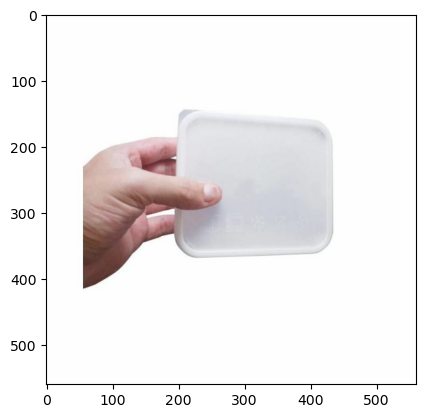

Working with image: barquette-plastique-blanche-avec-couvercle-750-ml-par-200.jpg


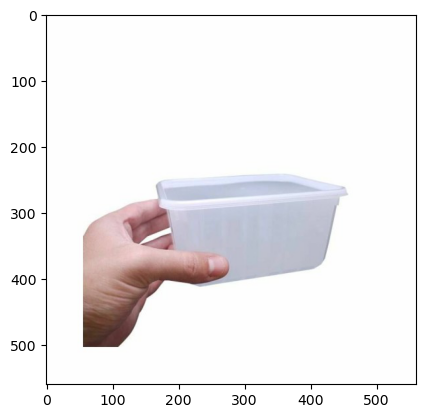

Working with image: barquette-plastique-charcutiere-1000-ml-par-250.jpg


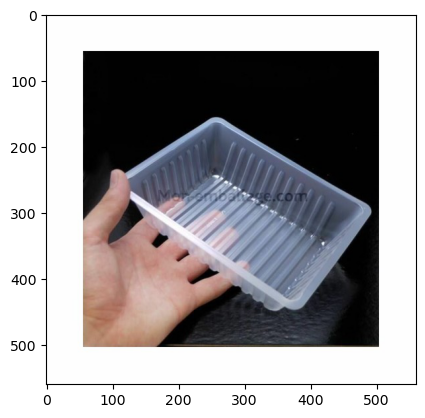

Working with image: barquette-plastique-charcutiere-125-ml-par-500.jpg


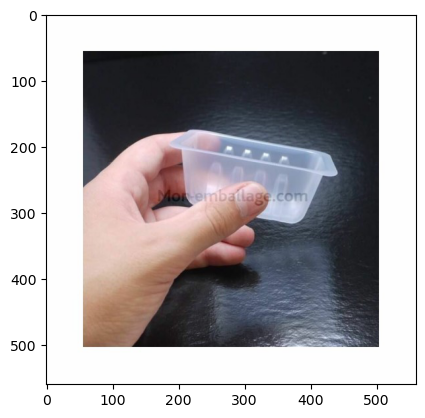

Working with image: barquette-plastique-charcutiere-200-ml-par-500.jpg


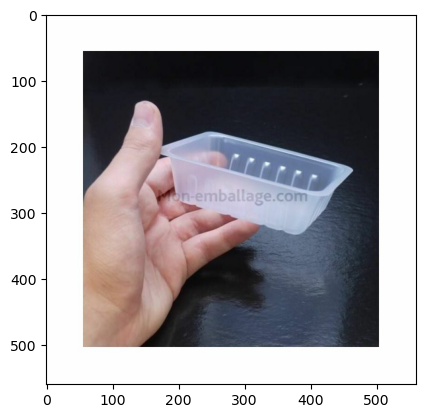

Working with image: barquette-plastique-charcutiere-2000-ml-par-250.jpg


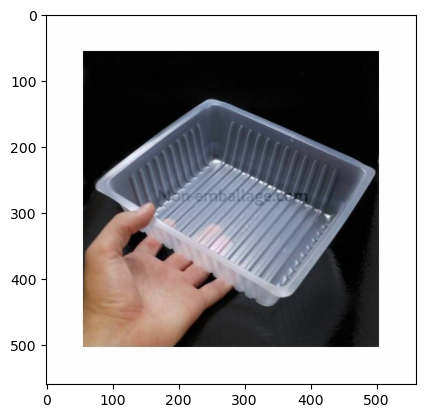

Working with image: barquette-plastique-charcutiere-250-ml-par-500.jpg


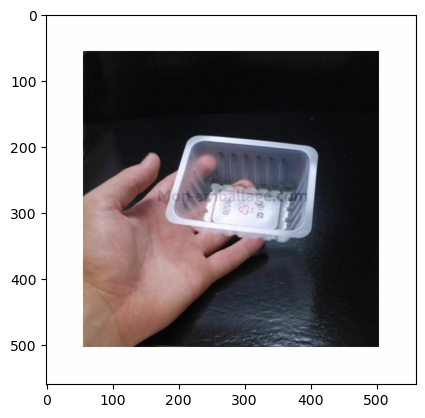

Working with image: barquette-plastique-charcutiere-375-ml-par-250.jpg


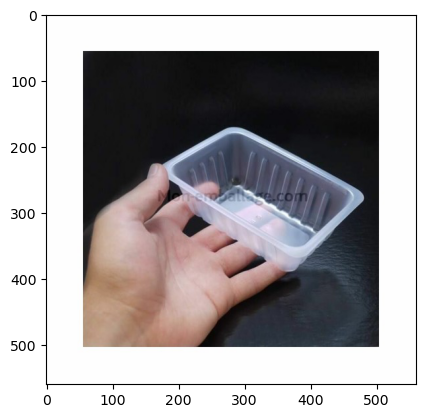

Working with image: barquette-plastique-charcutiere-500-ml-par-250.jpg


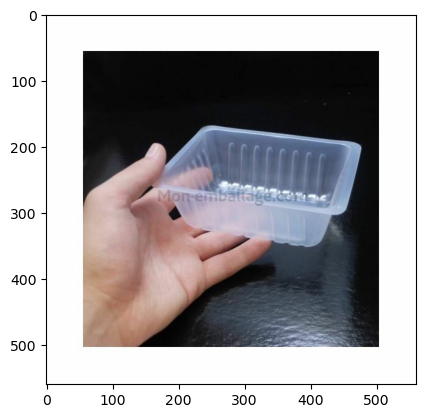

Working with image: barquette-plastique-charcutiere-75-ml-par-500.jpg


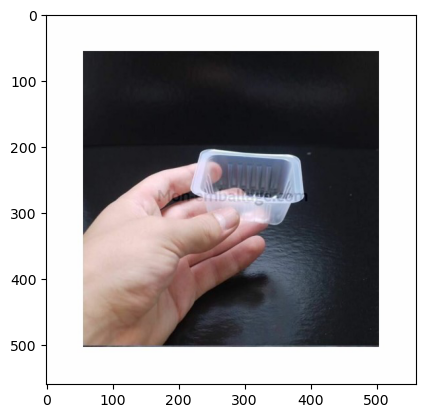

Working with image: barquette-plastique-charcutiere-750-ml-par-250.jpg


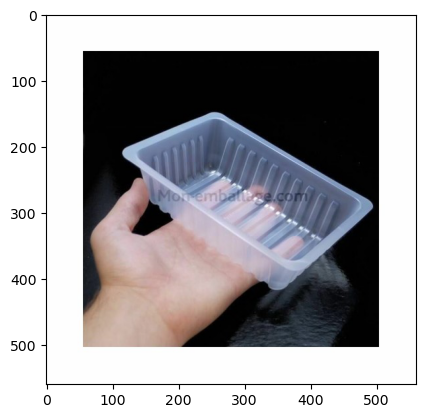

Working with image: barquette-plastique-noire-scellable-1000-ml-par-100.jpg


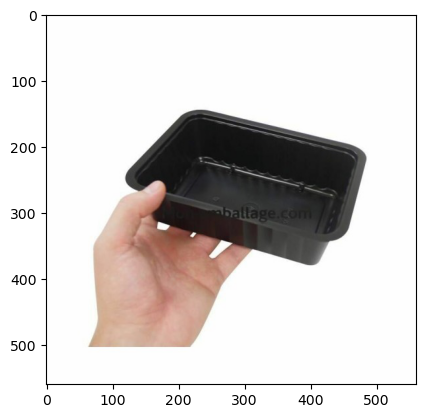

Working with image: barquette-plastique-noire-scellable-500-ml-par-100.jpg


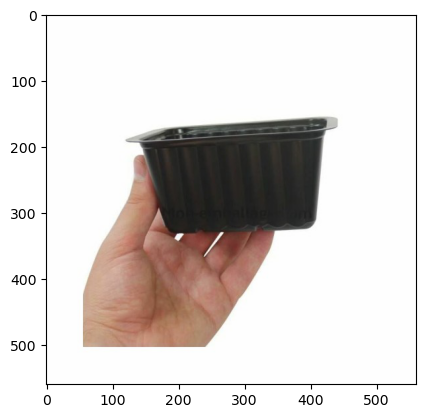

Working with image: barquette-plastique-transparente-avec-couvercle-attenant-standipack-250-ml-par-800.jpg


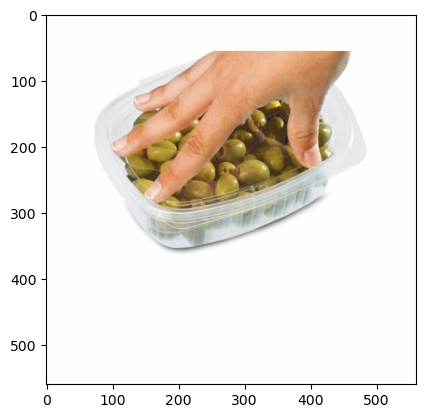

Working with image: barquette-plastique-transparente-avec-couvercle-attenant-standipack-500-ml-par-500.jpg


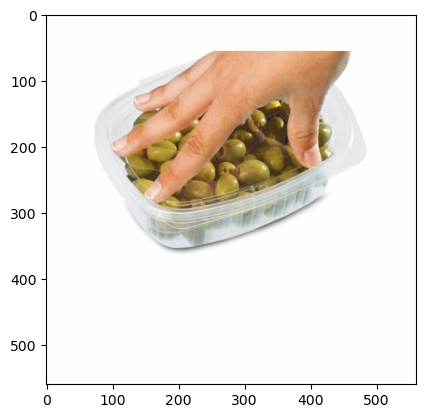

Working with image: barquette-plastique-transparente-avec-couvercle-attenant-standipack-750-ml-par-400.jpg


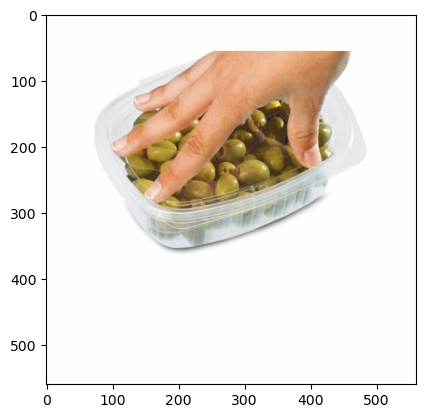

Working with image: barquette-plastique-transparente-scellable-1000-ml-par-100.jpg


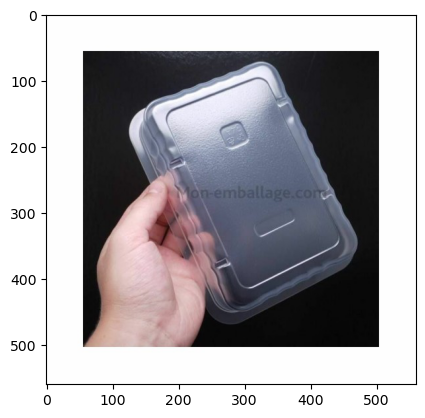

Working with image: barquette-plastique-transparente-scellable-1500-ml-par-100.jpg


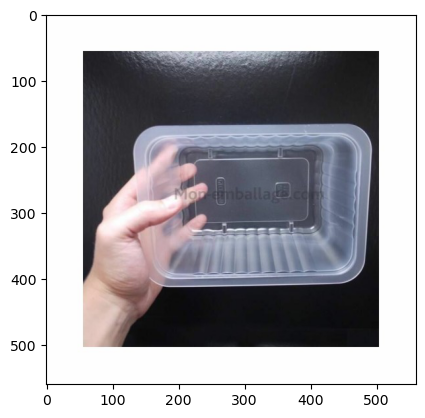

Working with image: barquette-plastique-transparente-scellable-375-ml-par-100.jpg


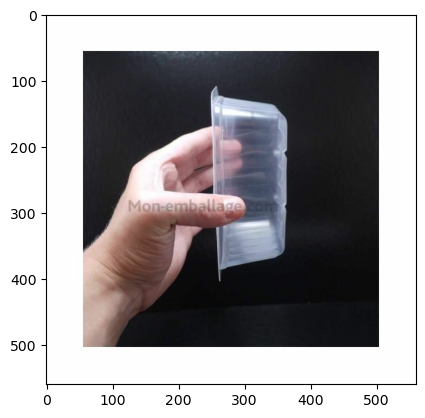

Working with image: barquette-plastique-transparente-scellable-500-ml-par-100.jpg


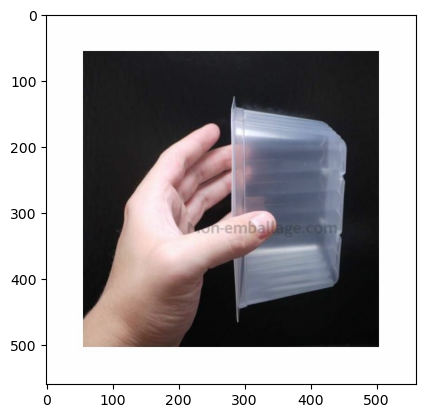

Working with image: barquette-plastique-transparente-scellable-750-ml-par-100.jpg


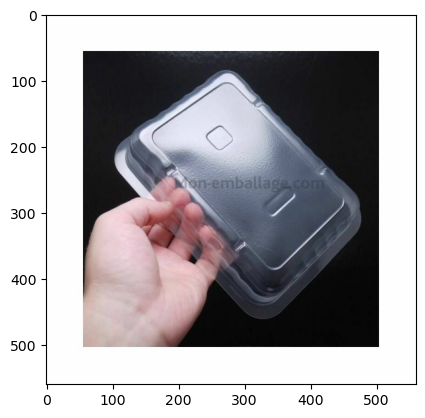

Working with image: blouse-jetable-blanche-par-100.jpg


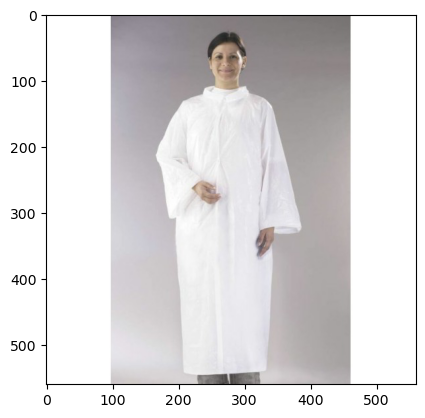

Working with image: boite-noire-pour-sushi-quadripack-17-x-105-cm-avec-couvercle-par-25.jpg


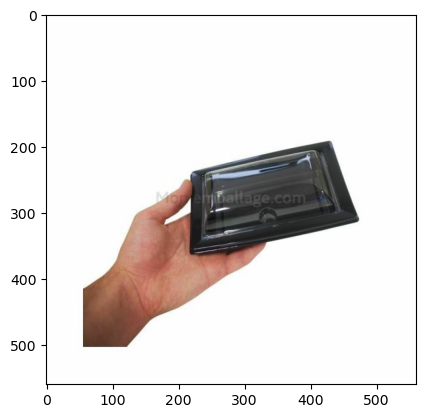

Working with image: boite-prestipack-transparente-600-ml-avec-couvercle-par-30.jpg


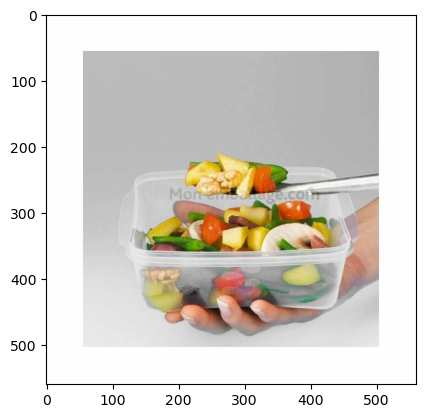

Working with image: boite-ronde-plastique-transparente-avec-couvercle-olipack-250-ml-par-480.jpg


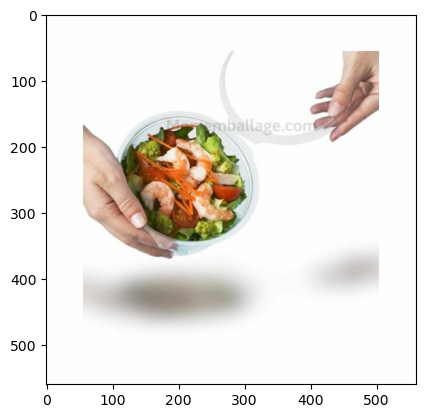

Working with image: boite-ronde-plastique-transparente-avec-couvercle-olipack-500-ml-par-480.jpg


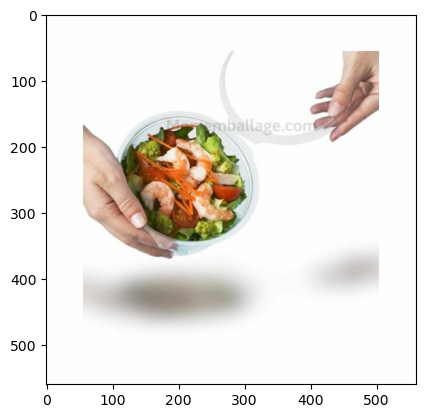

Working with image: boite-ronde-plastique-transparente-avec-couvercle-olipack-750-ml-par-200.jpg


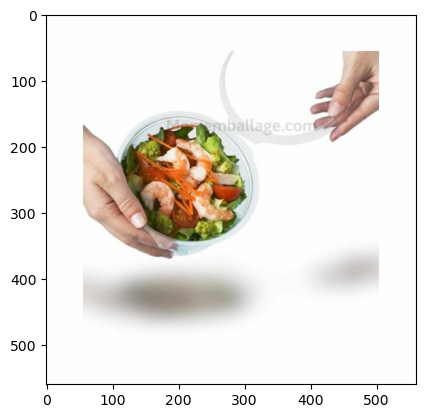

Working with image: boite-traiteur-carton-micro-cannelures-blanche-42-x-28-x-6-cm-par-25.jpg


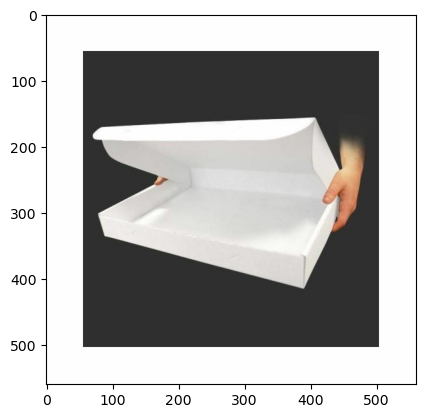

Working with image: boite-traiteur-carton-micro-cannelures-blanche-42-x-32-x-6-cm-par-25.jpg


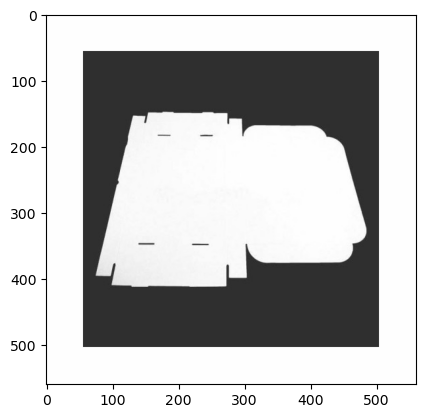

Working with image: bol-salade-plastique-transparent-a-couvercle-dechirable-750-ml-par-200.jpg


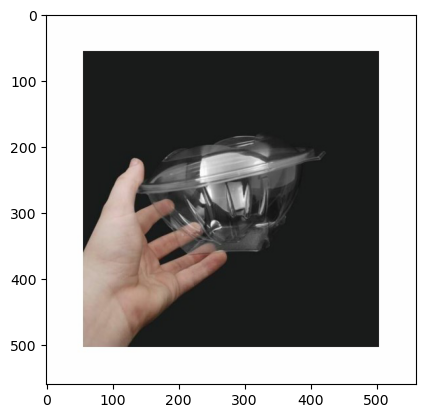

Working with image: caissette-plissee-blanche-28-x-2-cm-n5-par-1000.jpg


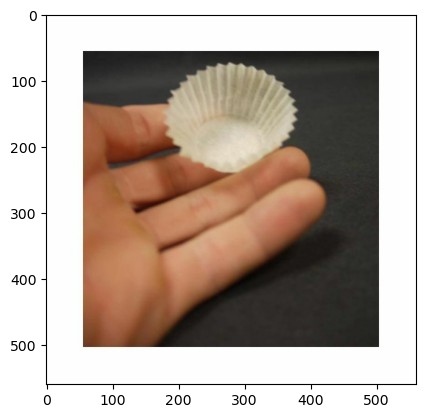

Working with image: caissette-plissee-ovale-blanche-105-x-4-x-25-cm-n88-par-1000.jpg


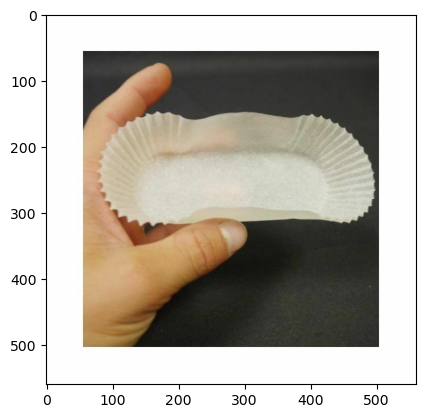

Working with image: caissette-plissee-ovale-brune-105-x-4-x-25-cm-n88-par-1000.jpg


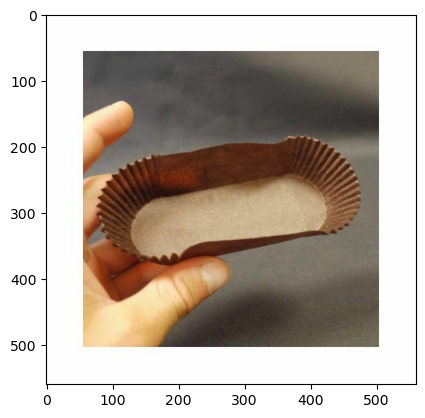

Working with image: caissette-plissee-ronde-blanche-25-x-18-cm-n4-par-1000.jpg


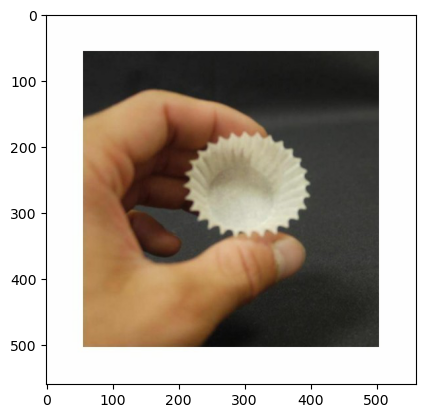

Working with image: caissette-plissee-ronde-blanche-53-x-32-cm-n10-bis-par-1000.jpg


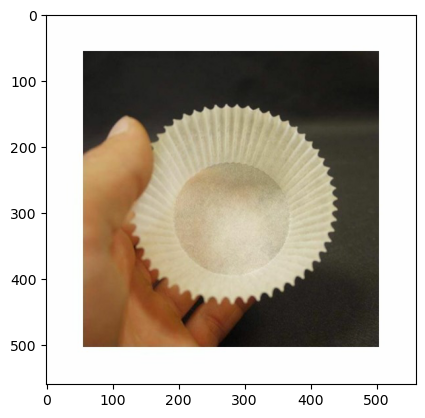

Working with image: charlotte-a-clip-blanche-par-100.jpg


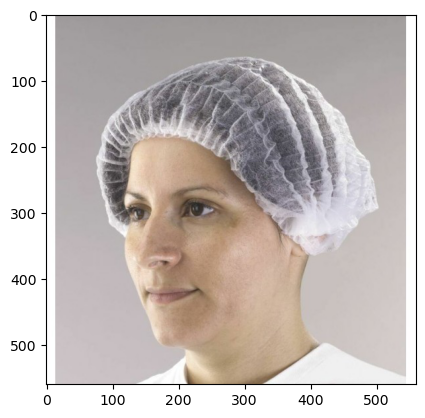

Working with image: charlotte-casquette-blanche-par-100.jpg


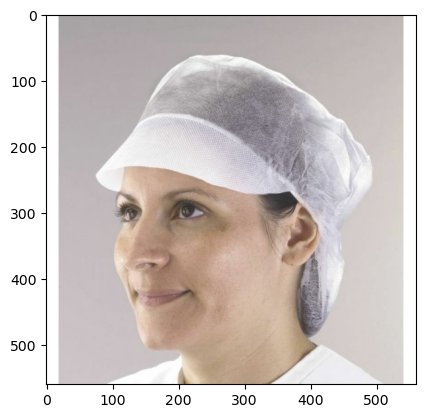

Working with image: charlotte-jetable-plastique-noir-par-100.jpg


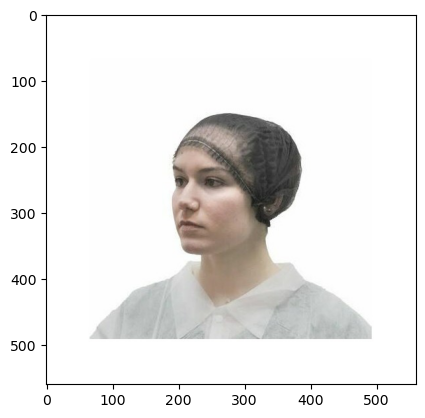

Working with image: couvercle-dome-plastique-transparent-pour-coupe-a-dessert-275-ml-par-50.jpg


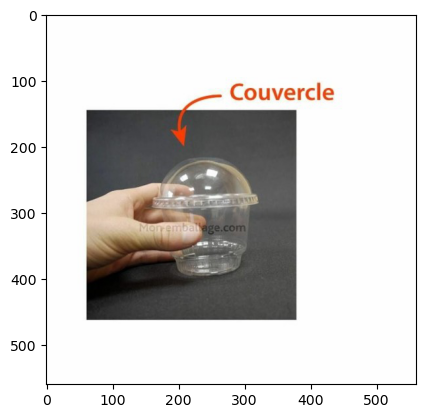

Working with image: distributeur-bobine-papier-portable-wypall-a-l-unite.jpg


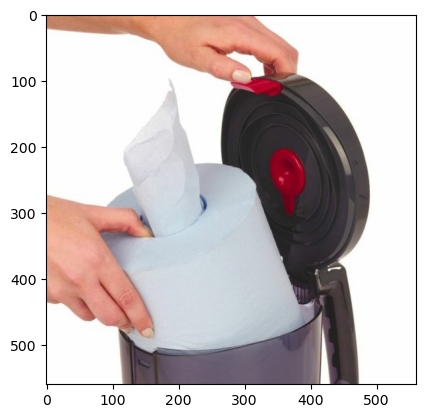

Working with image: distributeur-essuie-mains-enchevetre-a-l-unite.jpg


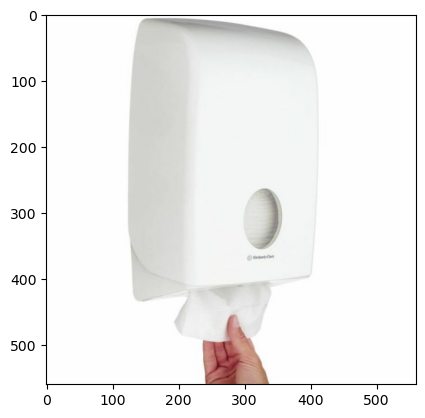

Working with image: emballage-frites-papier-magic-bag-par-250.jpg


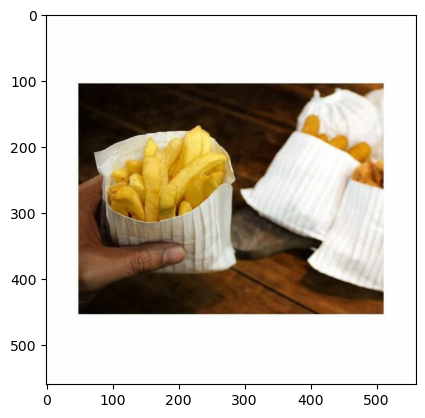

Working with image: etui-a-wrap-kraft-brun-305-x-118-x-4-cm-par-500.jpg


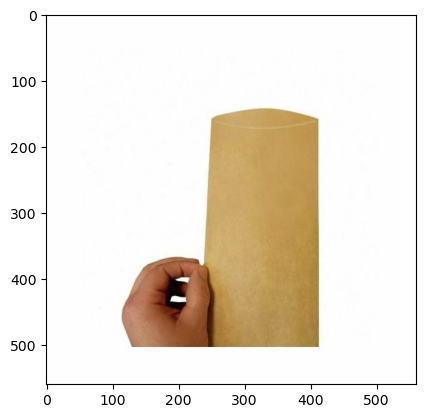

Working with image: gants-nitrile-bleus-non-poudres-taille-l-8-9-par-100.jpg


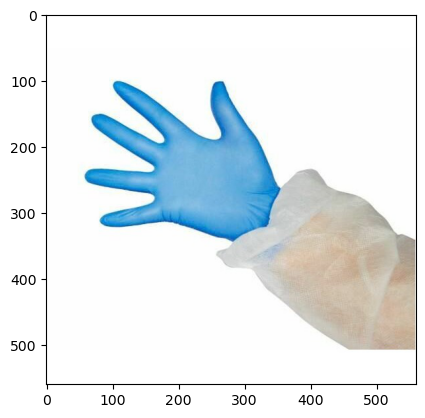

Working with image: gants-nitrile-bleus-non-poudres-taille-m-7-8-par-100.jpg


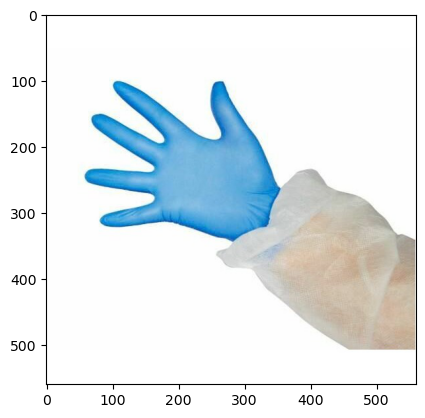

Working with image: gants-nitrile-bleus-non-poudres-taille-s-6-7-par-100.jpg


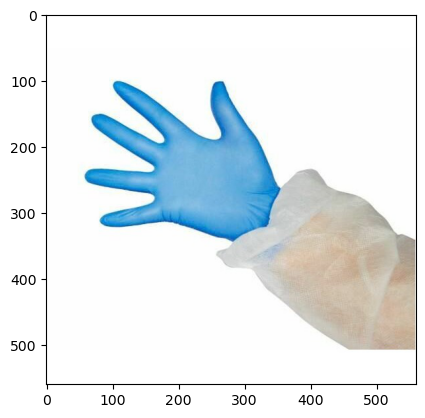

Working with image: gants-nitrile-bleus-non-poudres-taille-xl-9-10-par-100.jpg


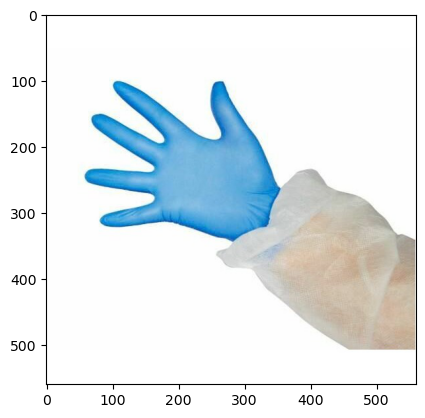

Working with image: gants-vinyle-naturel-micro-poudres-taille-s-6-7-par-100.jpg


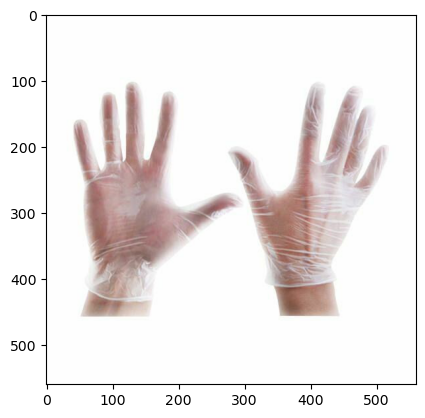

Working with image: grand-coffret-a-frites-refermable-kraft-brun-500-ml-par-450.jpg


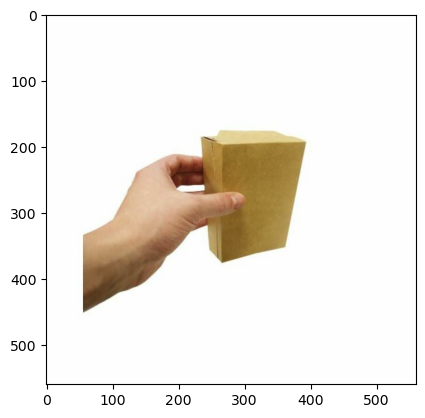

Working with image: grand-etui-a-frites-kraft-brun-500-ml-par-400.jpg


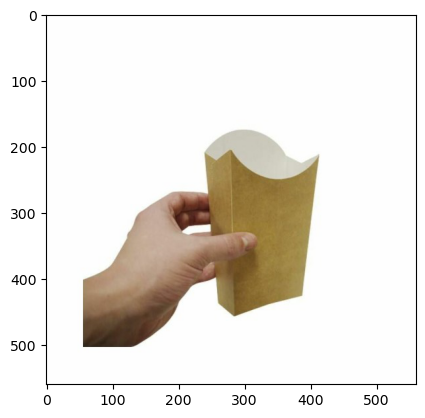

Working with image: kit-visiteur-jetable-par-100.jpg


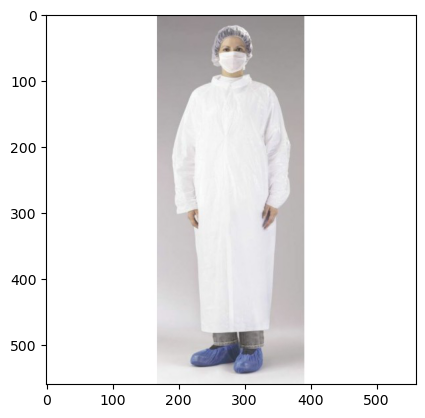

Working with image: manchette-elastiquee-plastique-opaque-blanc-20-x-40-cm-par-100.jpg


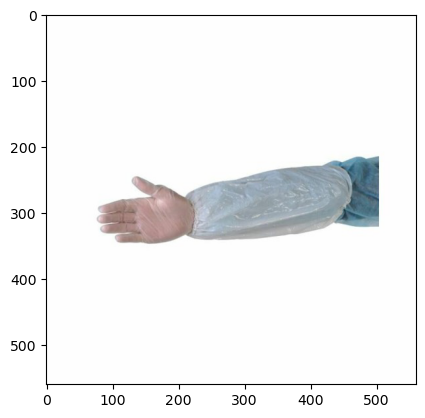

Working with image: manchette-plastique-non-tisse-20-x-40-cm-par-100.jpg


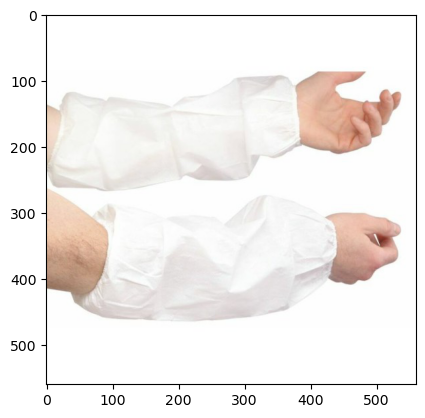

Working with image: masque-chirurgical-bleu-jetable-par-50.jpg


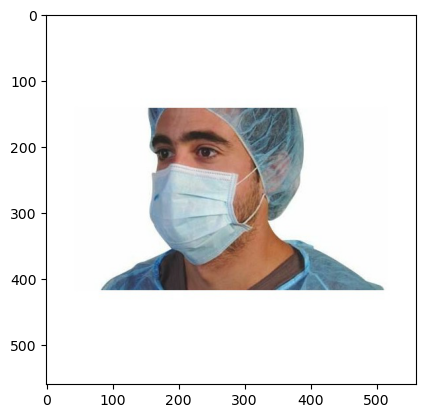

Working with image: mini-assiette-carree-bagasse-66-x-66-cm-par-50.jpg


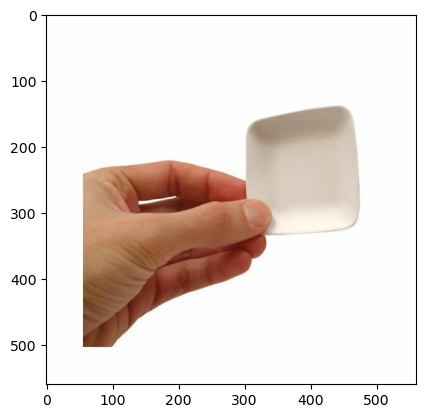

Working with image: mini-bol-bagasse-100-ml-par-50.jpg


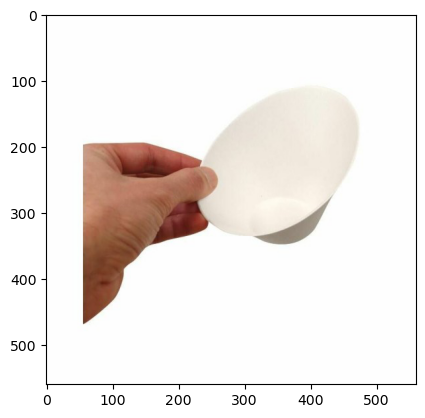

Working with image: moyenne-boite-hamburger-kraft-brun-124-x-124-x-7-cm-par-450.jpg


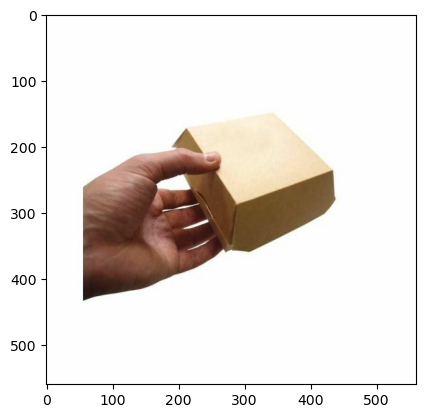

Working with image: petit-etui-a-frites-kraft-brun-en-carton-250-ml-par-600.jpg


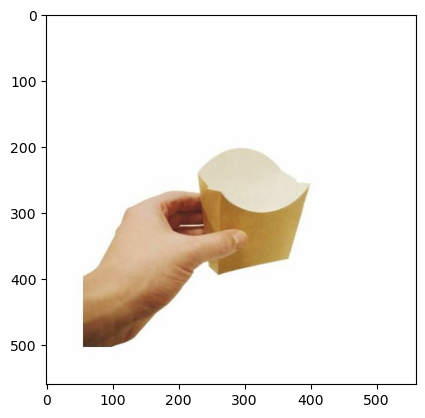

Working with image: pot-carton-blanc-480-ml-par-25.jpg


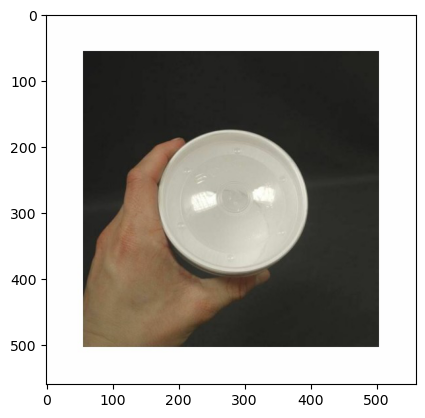

Working with image: sac-bouteille-kraft-brun-verge-14-8-x-39-cm-par-50.jpg


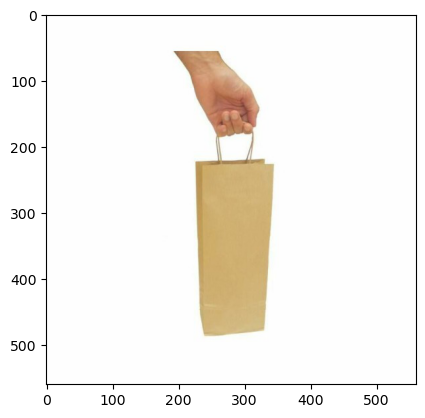

Working with image: sac-cabas-traiteur-plastique-avec-renfort-de-fond-22-x-21-x-28-cm-par-25.jpg


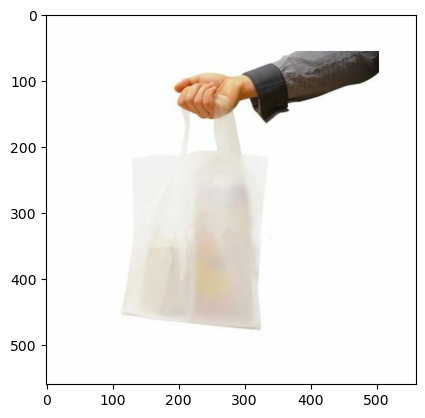

Working with image: sac-cabas-traiteur-plastique-avec-renfort-de-fond-32-x-22-x-30-cm-par-25.jpg


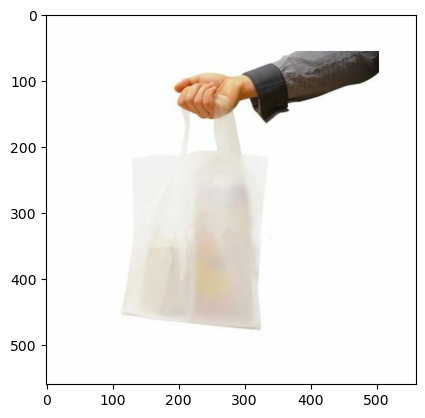

Working with image: sac-papier-kraft-brun-a-poignees-plates-18-8-x-22-cm-par-50.jpg


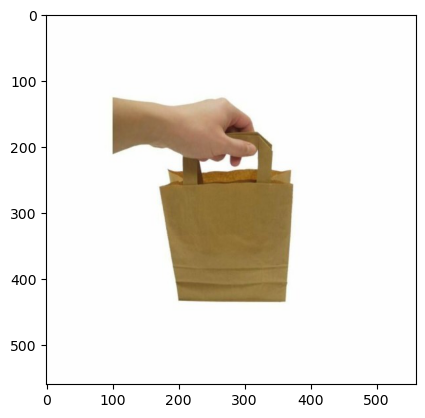

Working with image: sac-papier-kraft-brun-a-poignees-plates-32-17-x-27-cm-par-50.jpg


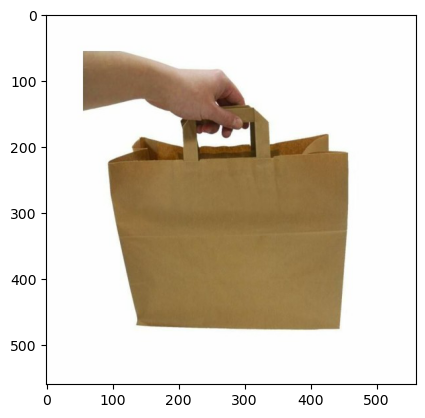

Working with image: sac-papier-kraft-brun-a-poignees-plates-32-17-x-43-cm-par-50.jpg


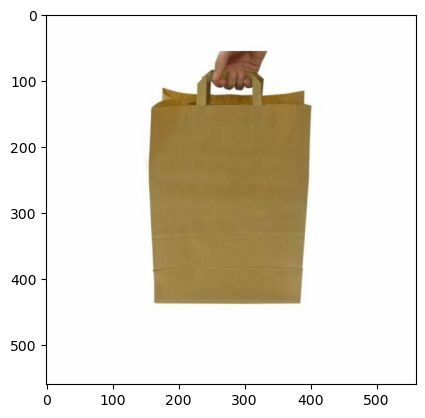

Working with image: sac-traiteur-kraft-brun-recycle-a-poignees-plates-32-x-21-x-27-cm-par-250.jpg


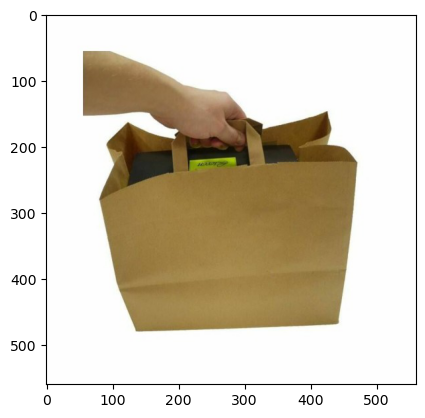

Working with image: sachet-cone-en-kraft-times-34-x-24-cm-par-250.jpg


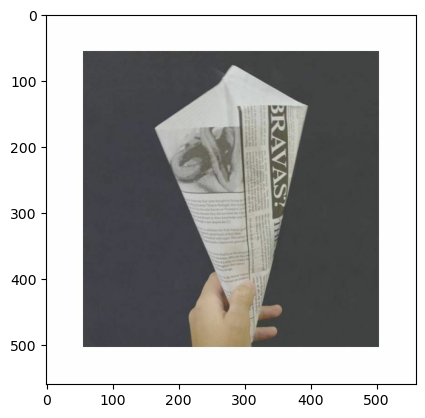

Working with image: sachet-cone-kraft-feel-green-295-x-21-cm-par-250.jpg


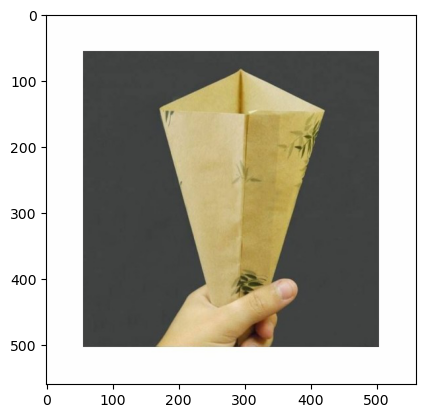

Working with image: sachet-cone-kraft-times-295-x-21-cm-par-250.jpg


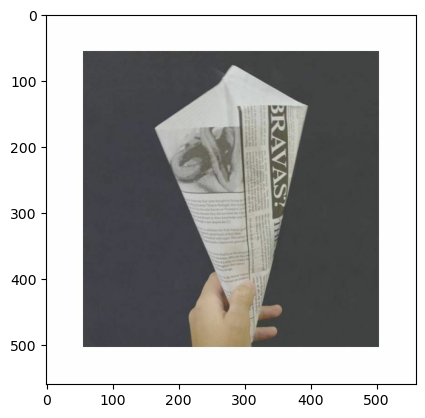

Working with image: sachet-croissants-papier-kraft-brun-12-5-x-16-cm-n101-par-1000.jpg


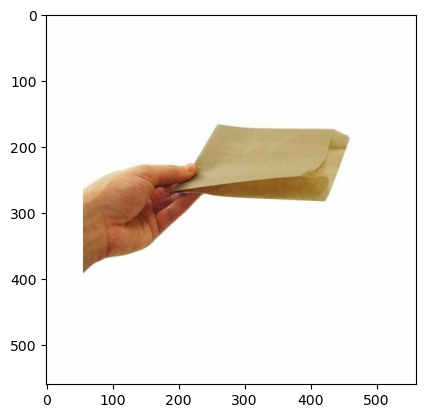

Working with image: sachet-croissants-papier-kraft-brun-14-7-x-21-cm-n103-par-1000.jpg


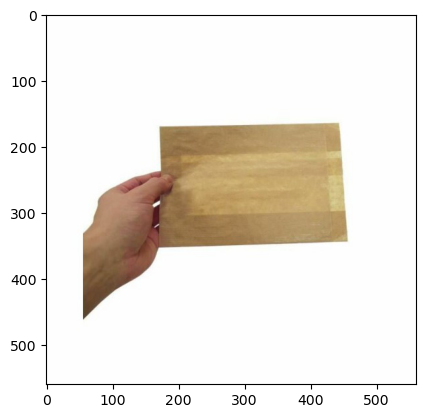

Working with image: sachet-croissants-papier-kraft-brun-14-7-x-28-cm-n104-par-1000.jpg


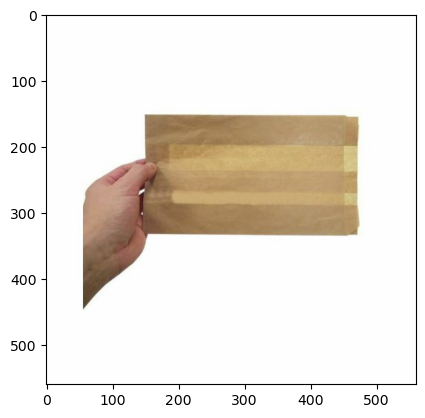

Working with image: saladier-plastique-transparent-14-cm-par-50.jpg


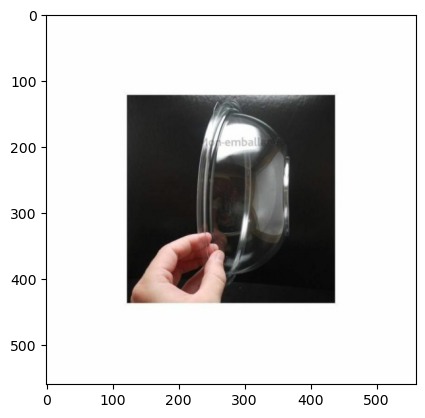

Working with image: surblouse-jetable-plastique-blanc-a-pression-par-50.jpg


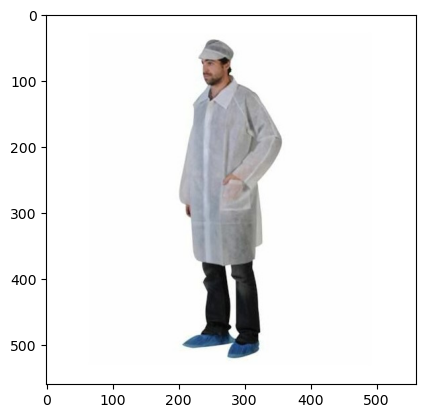

Working with image: tablier-jetable-plastique-noir-50-microns-70-x-120-cm-par-50.jpg


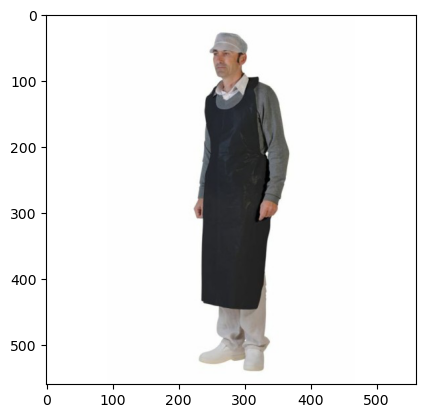

Working with image: tablier-plastique-jetable-gaufre-35-microns-70-x-120-cm-par-50.jpg


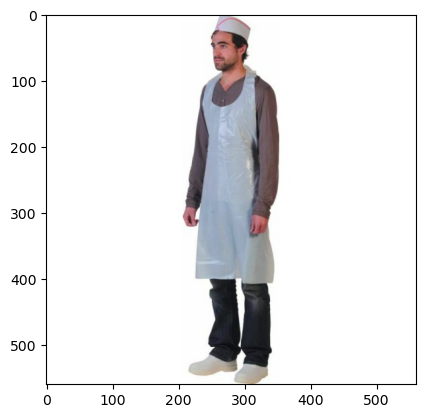

Working with image: tablier-plastique-jetable-gaufre-60-microns-70-x-140-cm-par-50.jpg


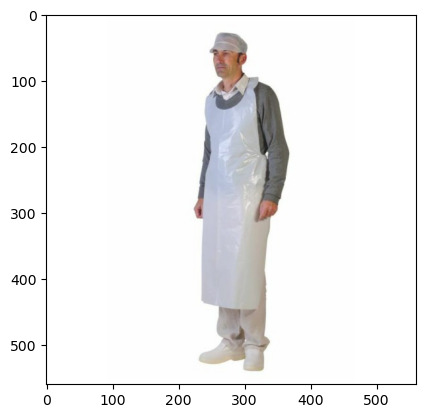

Working with image: toque-de-cuisine-jetable-reglable-23-cm-par-10.jpg


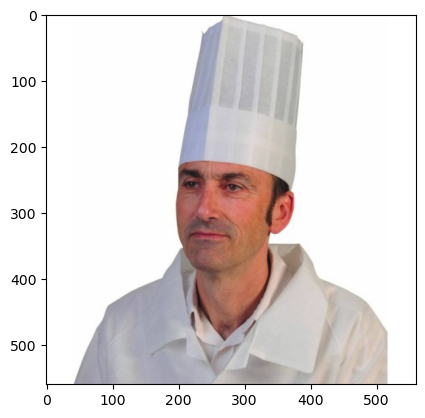

Working with image: toque-plissee-papier-jetable-noire-23-cm-par-10.jpg


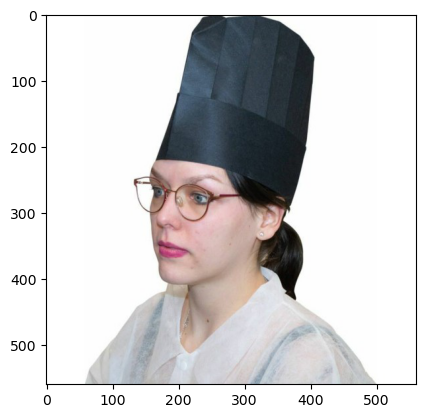

Working with image: verrine-bagasse-carree-50-ml-par-50.jpg


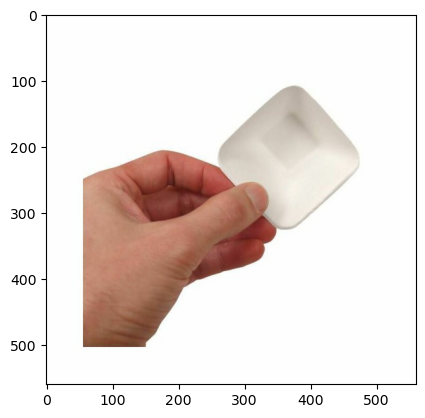

In [5]:
def load_img(filename):
  img = cv2.imread(f"CV_subset/CV_subset/{filename}")
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

def plot_img(img, title=None):
  if title:
    plt.title(title)
  plt.imshow(img)
  plt.show()

for filename in filenames:
  img = load_img(filename)
  print('Working with image:', filename)
  plot_img(img)

# CV2 functions

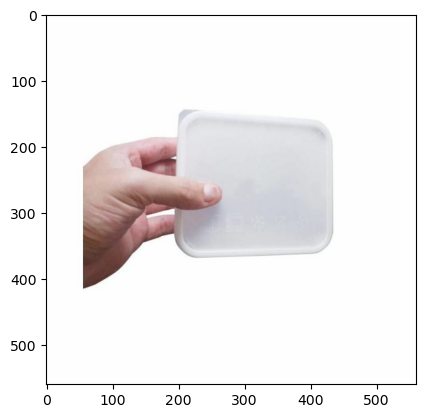

In [6]:
test_file = filenames[0]
test_img = load_img(test_file)
plot_img(test_img)

## Human skin detection

We will use color segmentation techniques such as YCrCb color space thresholding and adaptive histogram-based skin detection to identify human skin regions.

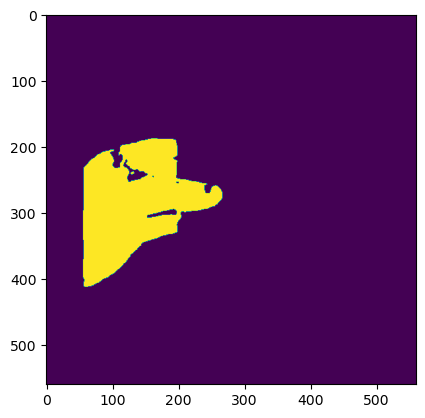

In [7]:
# YCrCb color thresholding
def skin_detect_YCrCb(img):
  img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
  y, cr, cb = cv2.split(img_ycrcb)
  cr1 = cv2.GaussianBlur(cr, (5, 5), 0)
  _, skin = cv2.threshold(cr1, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  return skin

skin1 = skin_detect_YCrCb(test_img)
plot_img(skin1)

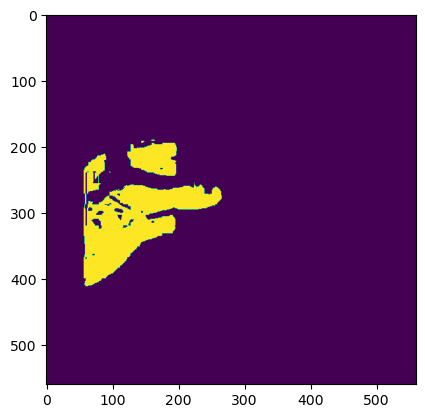

In [9]:
# Adaptive histogram-based
def skin_detect_adaptive(img):
  img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
  y, cr, cb = cv2.split(img_ycrcb)
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
  cl1 = clahe.apply(cr)
  _, skin = cv2.threshold(cl1, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  return skin

skin2 = skin_detect_adaptive(test_img)
plot_img(skin2)

The YCrCb thresholding works decently for skin detection but fails on clothed arms since clothes don't have the same chromatic properties as skin.

Adaptive histogram equalization (CLAHE) on the Cr channel may over-enhance non-skin areas, introducing noise.

Let's try to implement new techniques such as HSV, and combine those techniques together to balance strenghts and weaknesses.



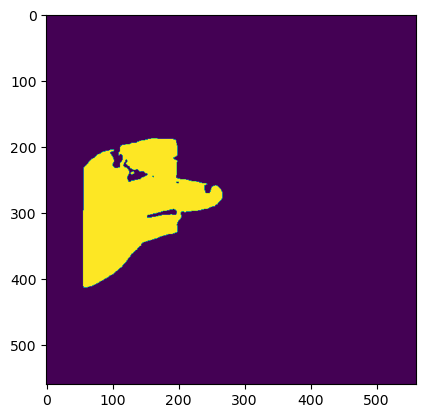

In [10]:
def skin_mask_combined(img):
    """ Detects skin regions using a combination of YCrCb and HSV thresholds. """
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    _, cr, cb = cv2.split(img_ycrcb)
    h, s, v = cv2.split(img_hsv)

    # Thresholds for YCrCb
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_ycrcb = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Adaptive threshold on S channel in HSV
    s_blur = cv2.GaussianBlur(s, (5, 5), 0)
    _, skin_hsv = cv2.threshold(s_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Combine masks
    skin_mask = cv2.bitwise_or(skin_ycrcb, skin_hsv)

    return skin_mask

skin = skin_mask_combined(test_img)
plot_img(skin)

## Edge and Contour Detection

Edge detection (e.g., Canny edge detection) and contour analysis can be applied to refine the segmentation and ensure accurate localization of body parts.

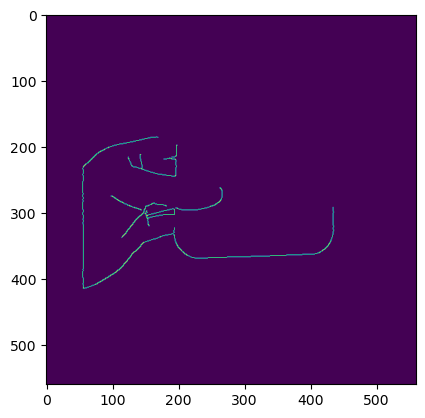

In [11]:
# Canny edge detection
def edge_canny(img):
  img_blur = cv2.GaussianBlur(img, (5, 5), 0)
  edges = cv2.Canny(image=img_blur, threshold1=100, threshold2=200)
  return edges

edges = edge_canny(test_img)
plot_img(edges)

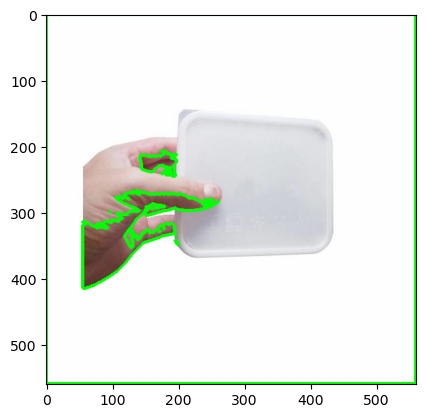

In [12]:
# Contour Analysis
def contour_analysis(img):
  gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  _, thresh = cv2.threshold(gray_img, 127, 255, 0)
  contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  return contours

contours = contour_analysis(test_img)
img_contours = cv2.drawContours(test_img.copy(), contours, -1, (0, 255, 0), 3)
plot_img(img_contours)

--> In our case, edge and contour detection might not be the best methods when used alone.
Instead, it should be used in complement to segmentation masks.

## Morphological Processing

Morphological operations such as dilation and erosion will be employed to remove noise and enhance the segmentation (skin) mask.

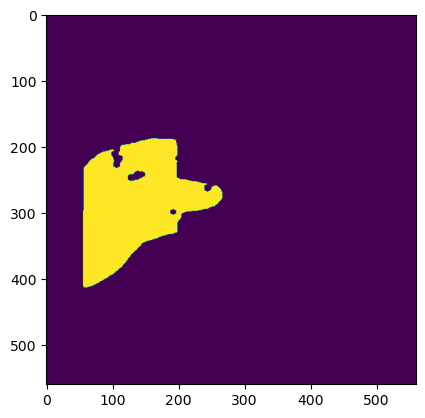

In [13]:
def refine_mask(mask):
    """ Applies morphological operations to clean up the skin mask. """
    kernel_size = 5  # Adaptable based on image size
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))

    # Closing (dilate → erode) to fill gaps
    mask_closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    return mask_closed

img_erode = refine_mask(skin)
plot_img(img_erode)

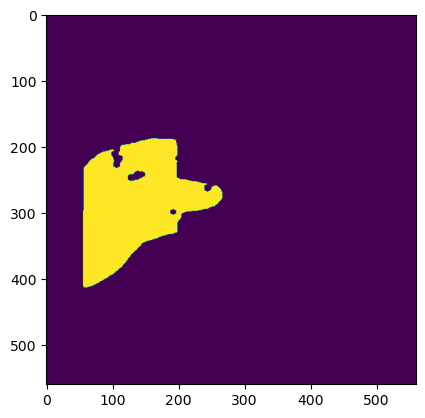

In [14]:
def remove_small_components(mask, min_size=500):
    """ Removes small noise blobs from the mask. """
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)

    # Create a blank mask
    clean_mask = np.zeros_like(mask)

    # Filter by area
    for i in range(1, num_labels):  # Skip background (label 0)
        if stats[i, cv2.CC_STAT_AREA] >= min_size:
            clean_mask[labels == i] = 255

    return clean_mask

img_erode = remove_small_components(img_erode)
plot_img(img_erode)

## Object Recognition for Contextual Analysis

We will utilize template matching or feature-based methods (e.g., ORB, SIFT) to detect and retain objects of interest while removing only human body parts.

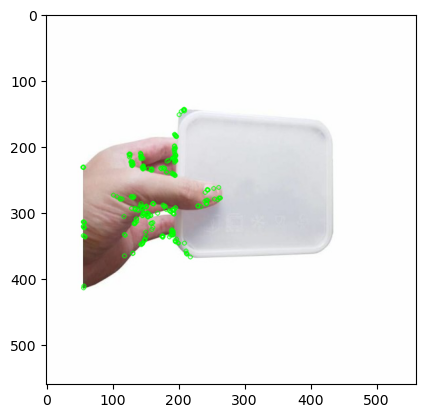

In [15]:
# ORB method
def object_recognition_ORB(img):
  orb = cv2.ORB_create()
  kp = orb.detect(img, None)
  img_kp = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=0)
  return img_kp

img_kp = object_recognition_ORB(test_img)
plot_img(img_kp)

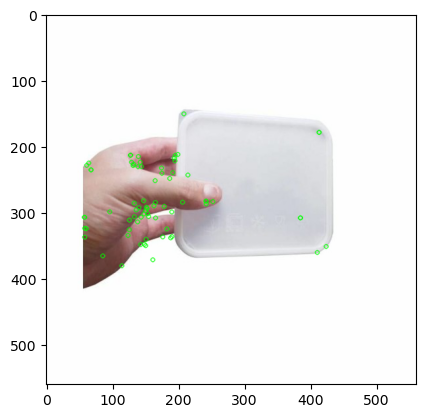

In [16]:
# SIFT method
def object_recognition_SIFT(img):
  sift = cv2.SIFT_create()
  kp = sift.detect(img, None)
  img_kp = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=0)
  return img_kp

img_kp2 = object_recognition_SIFT(test_img)
plot_img(img_kp2)

Those methods seems to detect keypoints for both the body part AND the object... It is too difficult to use those results, so we keep segmentation masks instead.

## Image Inpainting

To reconstruct the occluded background, we will implement non-learning-based inpainting techniques such as exemplar-based inpainting (e.g., Telea’s method or Criminisi’s algorithm).

This approach builds upon prior work in skin detection, object segmentation, and image inpainting but aims to develop an end-to-end pipeline specifically for human body part removal.

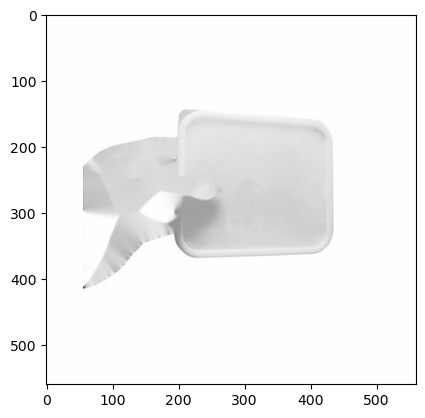

In [17]:
def inpaint_human_parts(img, mask):
    """ Inpaints the detected human parts using the mask. """
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Inpainting needs grayscale images, so convert input image accordingly
    img_inpaint = cv2.inpaint(img_gray, mask, 3, cv2.INPAINT_TELEA) #INPAINT_TS

    # Convert back to RGB (assuming original input is RGB)
    img_inpaint = cv2.cvtColor(img_inpaint, cv2.COLOR_GRAY2RGB)

    return img_inpaint

img_inpaint = inpaint_human_parts(test_img, img_erode)
plot_img(img_inpaint)

## Evaluation

In [18]:
def evaluate(img, img_inpaint):
  pass

# Final pipeline

Improve segmentation on clothed arms by incorporating texture analysis (e.g., Local Binary Patterns).
Use GrabCut segmentation to improve object-background separation.
Experiment with seam carving for better removal in some cases.

In [19]:
def remove_human_parts(img):
    """ Pipeline for removing human body parts. """
    skin_mask = skin_mask_combined(img)
    skin_mask_refined = refine_mask(skin_mask)
    skin_mask_clean = remove_small_components(skin_mask_refined)

    img_inpainted = inpaint_human_parts(img, skin_mask_clean)

    return img_inpainted, skin_mask_clean

Processing: barquette-plastique-blanche-avec-couvercle-450-ml-par-200.jpg


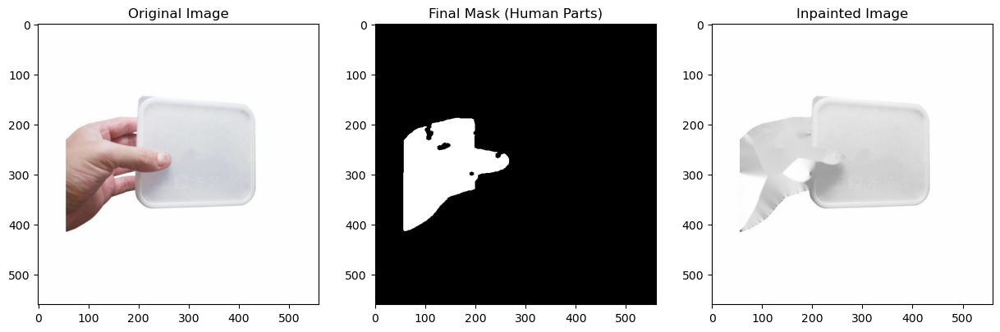

In [20]:
# Test on an image
test_file = filenames[0]
test_img = load_img(test_file)

print("Processing:", test_file)
img_inpainted, final_mask = remove_human_parts(test_img)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
ax1, ax2, ax3 = axes.ravel()
ax1.imshow(test_img)
ax1.set_title("Original Image")
ax2.imshow(final_mask, cmap="gray")
ax2.set_title("Final Mask (Human Parts)")
ax3.imshow(img_inpainted)
ax3.set_title("Inpainted Image")
plt.show()

# Prompted improvements

### v1

fails when two backgrounds in one image : filenames[30]

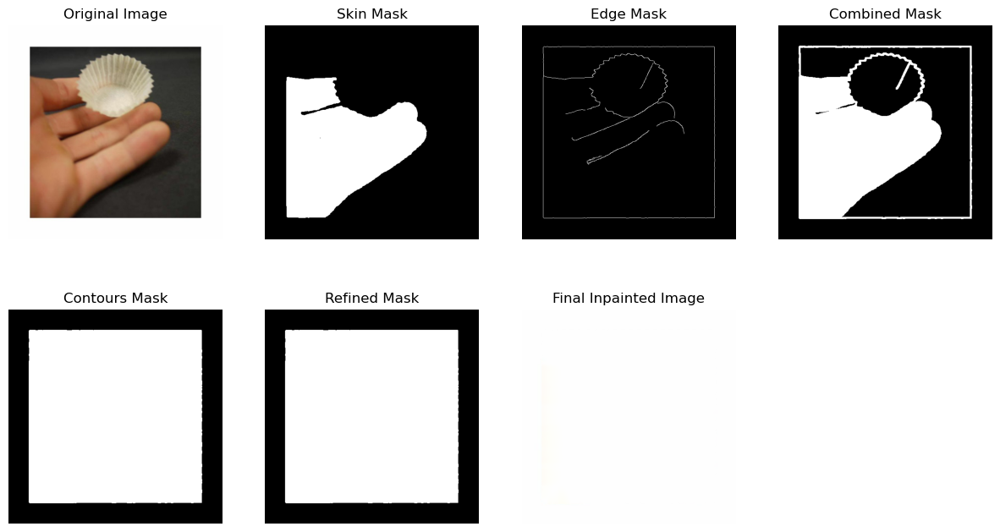

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

# Step 1: Skin Detection
def skin_detect(img):
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(img_ycrcb)
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return skin_mask

# Step 2: Edge Detection
def edge_detection(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 50, 150)
    return edges

# Step 3: Smarter Combination of Skin & Edge Masks
def combine_masks(skin_mask, edge_mask):
    combined_mask = cv2.bitwise_or(skin_mask, edge_mask)
    kernel = np.ones((5, 5), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=1)
    return combined_mask

# Step 4: Extract Human Contours with Improved Filtering
def extract_human_contours(mask, min_area=5000):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    return filtered_contours

# Step 5: Create Mask from Contours
def create_mask(img, contours):
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    return mask

# Step 6: Refine Mask using GrabCut
def refine_mask_with_grabcut(img, mask):
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)
    mask_grabcut = np.where(mask == 255, cv2.GC_FGD, cv2.GC_BGD).astype('uint8')
    cv2.grabCut(img, mask_grabcut, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)
    refined_mask = np.where((mask_grabcut == cv2.GC_FGD) | (mask_grabcut == cv2.GC_PR_FGD), 255, 0).astype('uint8')
    return refined_mask

# Step 7: Inpainting
def inpaint_image(img, mask):
    return cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Full Pipeline with Debugging
def remove_human_parts_with_visualization(img):
    skin_mask = skin_detect(img)
    edges = edge_detection(img)
    combined_mask = combine_masks(skin_mask, edges)
    contours = extract_human_contours(combined_mask)
    if not contours:
        print("No human body parts detected.")
        return img
    human_mask = create_mask(img, contours)
    refined_mask = refine_mask_with_grabcut(img, human_mask)
    img_final = inpaint_image(img, refined_mask)

    # Visualization
    show_images([
        img, skin_mask, edges, combined_mask, human_mask, refined_mask, img_final
    ], [
        "Original Image", "Skin Mask", "Edge Mask", "Combined Mask", "Contours Mask", "Refined Mask", "Final Inpainted Image"
    ], cmap='gray')

    return img_final

# Load an image and apply the pipeline
test_img = load_img(filenames[30])  # Replace with actual image
result_img = remove_human_parts_with_visualization(test_img)

### v2

fix the two backgrounds issue

No double background detected.


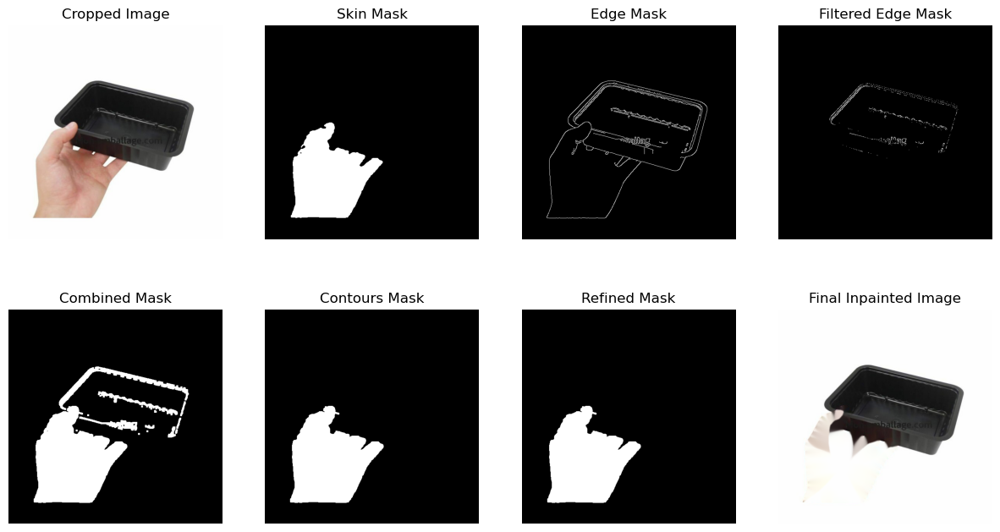

In [46]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

# Step 1: Skin Detection
def skin_detect(img):
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(img_ycrcb)
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return skin_mask

# Step 2: Edge Detection
def edge_detection(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 50, 150)
    return edges

# Step 3: Smarter Combination of Skin & Edge Masks
def combine_masks(skin_mask, edge_mask):
    combined_mask = cv2.bitwise_or(skin_mask, edge_mask)
    kernel = np.ones((5, 5), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=1)
    return combined_mask

# Step 4: Extract Human Contours with Improved Filtering
def extract_human_contours(mask, min_area=5000):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    return filtered_contours

# Step 5: Create Mask from Contours
def create_mask(img, contours):
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    return mask

# Step 6: Refine Mask using GrabCut
def refine_mask_with_grabcut(img, mask):
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    mask_grabcut = np.where(mask == 255, cv2.GC_FGD, cv2.GC_BGD).astype('uint8')

    #mask_grabcut[mask_grabcut == cv2.GC_BGD] = cv2.GC_PR_BGD
    #mask_grabcut[mask_grabcut == cv2.GC_FGD] = cv2.GC_PR_FGD

    cv2.grabCut(img, mask_grabcut, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)

    refined_mask = np.where((mask_grabcut == cv2.GC_FGD) | (mask_grabcut == cv2.GC_PR_FGD), 255, 0).astype('uint8')

    return refined_mask

# Step 7: Inpainting
def inpaint_image(img, mask):
    return cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Step 8: Detect Double Background
def detect_double_background(img, threshold=50):
    # Convert image to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Threshold to find the uniform background color
    _, bg_mask = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_BINARY)
    return bg_mask

# Step 9: Exclude Double Background for Edge Detection
def filter_edges_with_background(img, edge_mask):
    # Detect the background using color thresholding
    double_bg_mask = detect_double_background(img)

    # Combine edge mask and double background mask to exclude the background in the edge detection
    combined_mask = cv2.bitwise_and(edge_mask, cv2.bitwise_not(double_bg_mask))

    return combined_mask

# Full Pipeline with Debugging
def remove_human_parts_with_visualization(img):
    # The whole double_background_mask thing is useless because:
    # 1- The image never gets cropped
    # 2- It calls a function that just checks if there is a white padding, function that is already called in filter_edges_with_background


    # Check if double background exists
    double_background_mask = detect_double_background(img)

    # If double background detected, crop or resize to focus on the inner image
    if np.sum(double_background_mask == 255) > (img.size / 2):  # Adjust threshold as needed
        print("Double background detected (but no cropping).")
        """# Example crop, customize based on image layout
        h, w = img.shape[:2]
        img_cropped = img[50:h-50, 50:w-50]  # Crop borders"""
        img_cropped = img
    else:
        print("No double background detected.")
        img_cropped = img

    # Skin detection
    skin_mask = skin_detect(img_cropped)

    # Edge detection (after filtering background edges)
    edges = edge_detection(img_cropped)
    filtered_edges = filter_edges_with_background(img_cropped, edges)

    # Combine masks
    combined_mask = combine_masks(skin_mask, filtered_edges)

    # Extract human contours
    contours = extract_human_contours(combined_mask)

    if not contours:
        print("No human body parts detected.")
        return img_cropped

    human_mask = create_mask(img_cropped, contours)

    # Refine mask using GrabCut
    refined_mask = refine_mask_with_grabcut(img_cropped, human_mask)

    # Inpainting
    img_final = inpaint_image(img_cropped, refined_mask)

    # Visualization
    show_images([
        img_cropped, skin_mask, edges, filtered_edges, combined_mask, human_mask, refined_mask, img_final
    ], [
        "Cropped Image", "Skin Mask", "Edge Mask", "Filtered Edge Mask", "Combined Mask", "Contours Mask", "Refined Mask", "Final Inpainted Image"
    ], cmap='gray')

    return img_final

# Load an image and apply the pipeline
test_img = load_img(filenames[11])  # Replace with actual image
result_img = remove_human_parts_with_visualization(test_img)


### V3

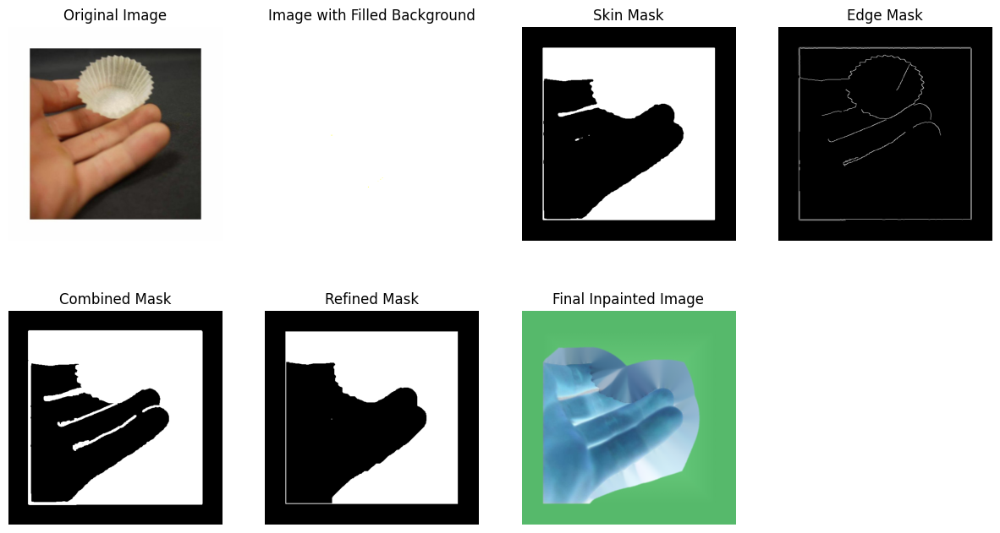

In [122]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

def skin_detect(img):
    # Ensure the image is in the correct 8-bit format
    if img.dtype != np.uint8:
        img = np.uint8(img * 255)  # Convert from float to uint8 if necessary

    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(img_ycrcb)
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return skin_mask

def edge_detection(img):
    # Ensure the image is in the correct 8-bit format
    if img.dtype != np.uint8:
        img = np.uint8(img * 255)  # Convert from float to uint8 if necessary

    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 50, 150)
    return edges


# Step 3: Detect Straight Lines (Borders)
def detect_straight_lines(img, threshold=100):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold, minLineLength=100, maxLineGap=10)
    return lines

# Step 4: Fill Outer Background with Inner Background Color
def fill_outer_background(img, lines):
    # Identify bounding box of the inner image (inside the straight lines)
    if lines is None:
        return img  # If no lines detected, return the original image

    # Create a mask of the detected lines (binary mask where the lines are 255)
    mask = np.zeros_like(img, dtype=np.uint8)
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(mask, (x1, y1), (x2, y2), (255, 255, 255), 2)

    # Convert mask to a single channel (grayscale) binary mask for bounding box calculation
    mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

    # Find the bounding box of the inner region (where lines form a rectangle)
    rect = cv2.boundingRect(mask_gray)
    x, y, w, h = rect

    # Extract the inner image and the background
    inner_img = img[y:y+h, x:x+w]
    outer_background = np.ones_like(img) * np.mean(inner_img, axis=(0, 1))  # Fill with inner background color

    # Combine the inner image with the new background
    outer_background[y:y+h, x:x+w] = inner_img
    return outer_background

def refine_mask_with_grabcut(img, mask):
    # Ensure the image is in the correct 8-bit color format
    if img.dtype != np.uint8:
        img = np.uint8(img * 255)  # Convert from float to uint8 if necessary

    # Check if the image is in grayscale, if so, convert it to BGR
    if len(img.shape) == 2:  # Grayscale image
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

    # Initialize the GrabCut algorithm
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    # Set the mask for GrabCut
    mask_grabcut = np.zeros_like(mask, np.uint8)
    mask_grabcut[mask == 0] = cv2.GC_BGD
    mask_grabcut[mask == 255] = cv2.GC_FGD
    mask_grabcut[mask == 127] = cv2.GC_PR_BGD
    mask_grabcut[mask == 255] = cv2.GC_PR_FGD

    # Run GrabCut with improved initial mask
    cv2.grabCut(img, mask_grabcut, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)

    # Create the final mask (foreground + probable foreground)
    refined_mask = np.where((mask_grabcut == cv2.GC_FGD) | (mask_grabcut == cv2.GC_PR_FGD), 255, 0).astype('uint8')

    return refined_mask


def inpaint_image(img, mask):
    # Ensure the image is in uint8 format and has 3 channels (BGR/RGB)
    if img.dtype != np.uint8:
        img = np.uint8(img * 255)  # Convert from float to uint8 if necessary

    if len(img.shape) == 2:  # Grayscale image
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

    # Ensure the mask is single-channel (binary)
    if len(mask.shape) == 3:  # If mask has 3 channels (e.g., RGB)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    elif len(mask.shape) != 2:  # If it's not 2D (grayscale), raise an error
        raise ValueError("Mask must be a 2D grayscale image")

    # Apply inpainting
    inpainted_img = cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

    return inpainted_img


# Full Pipeline with Debugging
def remove_human_parts_with_visualization(img):
    # Detect straight lines (borders) to identify inner and outer regions
    lines = detect_straight_lines(img)

    # If lines are detected, fill outer background with the inner background color
    img_with_filled_bg = fill_outer_background(img, lines)

    # Skin detection
    skin_mask = skin_detect(img_with_filled_bg)

    # Edge detection
    edges = edge_detection(img_with_filled_bg)

    # Combine skin and edge masks
    combined_mask = cv2.bitwise_or(skin_mask, edges)
    kernel = np.ones((5, 5), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=1)

    # Refine mask using GrabCut
    refined_mask = refine_mask_with_grabcut(img_with_filled_bg, combined_mask)

    # Inpainting
    img_final = inpaint_image(img_with_filled_bg, refined_mask)

    # Visualization
    show_images([
        img, img_with_filled_bg, skin_mask, edges, combined_mask, refined_mask, img_final
    ], [
        "Original Image", "Image with Filled Background", "Skin Mask", "Edge Mask", "Combined Mask", "Refined Mask", "Final Inpainted Image"
    ], cmap='gray')

    return img_final

# Load an image and apply the pipeline
test_img = load_img(filenames[30])  # Replace with actual image
result_img = remove_human_parts_with_visualization(test_img)
